# FExGAN-Meta

In [1]:
import tensorflow as tf

import os
import time
from os import path
from matplotlib import pyplot as plt

from Generator import makeGenerator
from Discriminator import makeDiscriminator
import datetime
import numpy as np
import pathlib
import random

D:\Anaconda\envs\tensorflow\lib\site-packages\numpy\_distributor_init.py:32: UserWarning: loaded more than 1 DLL from .libs:
D:\Anaconda\envs\tensorflow\lib\site-packages\numpy\.libs\libopenblas.WCDJNK7YVMPZQ2ME2ZZHJJRJ3JIKNDB7.gfortran-win_amd64.dll
D:\Anaconda\envs\tensorflow\lib\site-packages\numpy\.libs\libopenblas.NOIJJG62EMASZI6NYURL6JBKM4EVBGM7.gfortran-win_amd64.dll
  stacklevel=1)


## Loading and Preparing Data

In [2]:
data_path = pathlib.Path("G:\Datasets\MH-FED128")
ids = np.array(sorted([item.name for item in data_path.glob('*')]) )
affects = np.array(sorted([item.name for item in data_path.glob('Aoi/*')]) )

EPOCHS = 50
BUFFER_SIZE = 15000
BATCH_SIZE = 32
IMG_WIDTH = 128
IMG_HEIGHT = 128

num_characters = len(ids)
num_classes = len(affects)

def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_png(image,channels=3)
    image = tf.cast(image, tf.float32)
    
    path_strs = tf.strings.split(image_file, os.path.sep)
    one_hot_affect = path_strs[-2] == affects
    one_hot_char_id = path_strs[-3] == ids
    affect_indx = tf.argmax(one_hot_affect)
    char_id_indx = tf.argmax(one_hot_char_id)
    label = [affect_indx,char_id_indx]
    
    return image, label



def normalize(image):
    image = (image / 127.5) - 1
    return image

def resize(image):
    image = tf.image.resize(image, [IMG_HEIGHT, IMG_WIDTH],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return image

def load_images(image_file):
    image, label = load(image_file)
    #image = resize(image)
    image = normalize(image)
    return image, label


ref_ds = [[None for j in range(len(affects))] for i in range(len(ids))]


def prepare_dataset():
    
    dataset = tf.data.Dataset.list_files(str(data_path/'*/*/*'))
    # split the data into train and validation sets
    image_count = len(list(dataset))
    print("Total_images:"+str(image_count))
    val_size = int(image_count * 0.3)
    train_ds = dataset.skip(val_size)
    val_ds = dataset.take(val_size)
    
    print("Training_images:"+str(len(list(train_ds))))
    print("Validation images:"+str(len(list(val_ds))))
    train_ds = train_ds.map(load_images, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    
    # Saving reference images
    for ch_idx in range(num_characters):
        for c in range(num_classes):
        
            ds = train_ds.filter(lambda x,y,a=c,i=ch_idx: tf.greater(tf.reduce_sum(tf.cast(tf.equal(y,[a,i]), tf.float32)), tf.constant(1.)) ) 
            ds = ds.map(lambda x,y: x)
            ref_ds[ch_idx][c] = ds
        
    
    train_ds = train_ds.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)


    val_ds = val_ds.map(load_images)
    val_ds = val_ds.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)


    return train_ds,val_ds

In [3]:
def load_dataset_sampled(subsample_ratio):
    
        
    image_count = 0
    train_count = 0
    val_count = 0
    train_ds = None
    val_ds = None
    # Saving all datasets - one for each character, affect pair
    for ch_idx in range(num_characters):
        for c_idx in range(num_classes):
            
            file_path = str(data_path)+'/'+ids[ch_idx]+'/'+affects[c_idx]+'/*.jpg'
            
            ds = tf.data.Dataset.list_files(file_path)
            count = len(list(ds))
            sample_count = int(count*subsample_ratio)
            ds = ds.take(int(sample_count))
            
            
            val_size = int(sample_count * 0.2)
            
            ds_t = ds.skip(val_size)
            ds_v = ds.take(val_size)
            
            
            if(train_ds==None):
                train_ds = ds_t
            else:
                train_ds = train_ds.concatenate(ds_t)
            
            if(val_ds==None):
                val_ds = ds_v
            else:
                val_ds = val_ds.concatenate(ds_v)
            
            
            ref_ds[ch_idx][c_idx] = ds_t.take(int(0.5*(sample_count-val_size)))
            ref_ds[ch_idx][c_idx] = ref_ds[ch_idx][c_idx].map(load_images, num_parallel_calls=tf.data.experimental.AUTOTUNE).map(lambda x,y:x)
            ref_ds[ch_idx][c_idx] = ref_ds[ch_idx][c_idx].prefetch(tf.data.experimental.AUTOTUNE)
            
            
            image_count = image_count + sample_count
            val_count = val_count + val_size
            train_count = train_count + (sample_count-val_size)
            
            
    train_ds = train_ds.shuffle(BUFFER_SIZE,reshuffle_each_iteration=False).map(load_images, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    val_ds = val_ds.shuffle(BUFFER_SIZE,reshuffle_each_iteration=False).map(load_images, num_parallel_calls=tf.data.experimental.AUTOTUNE)
    
    print("Total_images:"+str(image_count))
    
    #ds = tf.data.Dataset.from_tensor_slices(train_ds)
    #train_ds = ds.interleave(lambda x: x, cycle_length=1, num_parallel_calls=tf.data.AUTOTUNE)
    
    #ds = tf.data.Dataset.from_tensor_slices(val_ds)
    #val_ds = ds.interleave(lambda x: x, cycle_length=1, num_parallel_calls=tf.data.AUTOTUNE)
    
    print("Training_images:"+str(train_count))
    print("Validation images:"+str(val_count))
    
    train_ds = train_ds.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)


    val_ds = val_ds.batch(BATCH_SIZE).prefetch(tf.data.experimental.AUTOTUNE)

      
    return train_ds,val_ds

In [4]:
#train_ds,val_ds = prepare_dataset()
train_ds,val_ds = load_dataset_sampled(0.5)

Total_images:80979
Training_images:64813
Validation images:16166


## Viewing Images

In [5]:
import numpy as np


def view_images(images,labels,nr_imgs,row,col):
    
    fig = plt.figure(figsize=(3*col,2*row))
    
    for i in range(nr_imgs):
        ax = fig.add_subplot(row, col, i+1)
        ax.imshow(images[i] * 0.5 + 0.5)
        ax.title.set_text(affects[labels[i][0]])
        ax.axis('off')
        

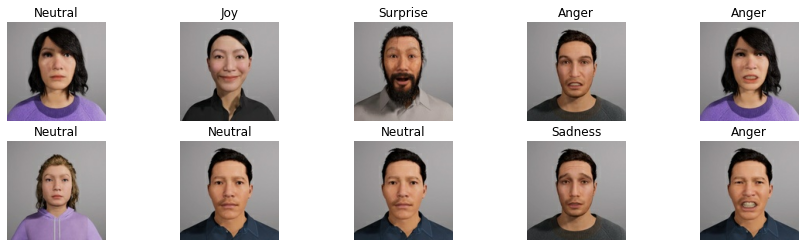

In [6]:
for img_batch, labels in val_ds.take(1):
    view_images(img_batch,labels,10,2,5) 

## Saving reference images for ID verification

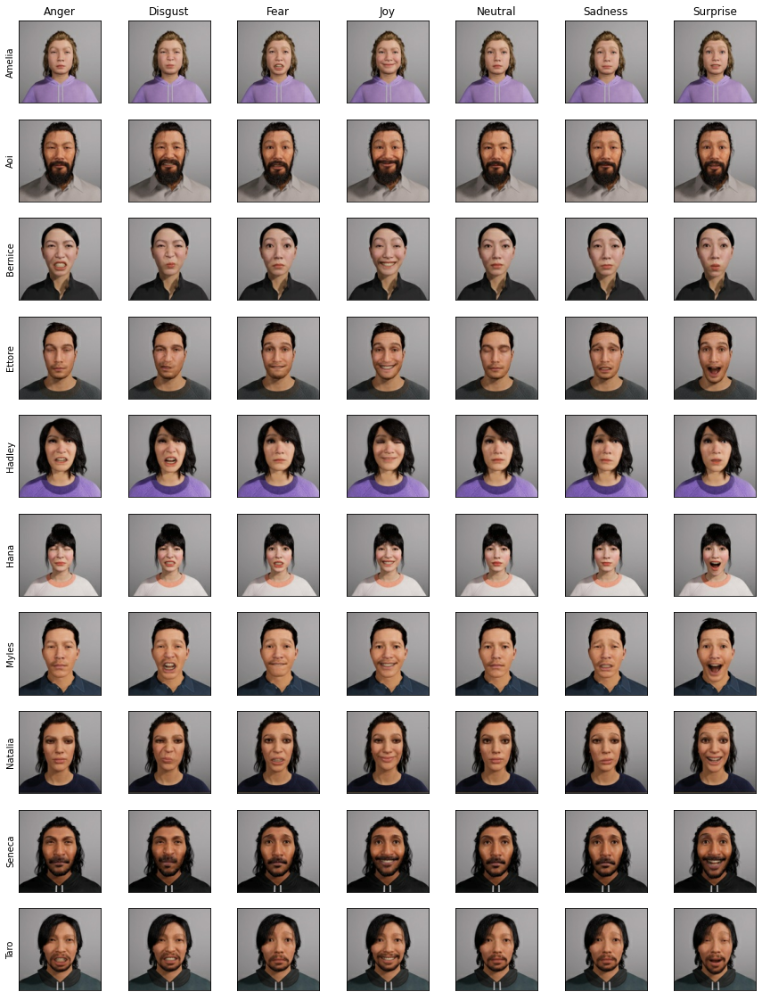

In [7]:
fig = plt.figure(figsize=(15,20))
for r in range(num_characters):
    for c in range(num_classes):
        img ,= ref_ds[r][c].take(1)
        #idx =random.randint(0,len(ref_images[r][c])-1)
        img = img*0.5+0.5
        #img = ref_images[r,c,:,:,:]*0.5+0.5
        ax = fig.add_subplot(num_characters,num_classes,num_classes*r+c+1)
        ax.imshow(img)
        ax.set_yticks([])
        ax.set_xticks([])
        if(r==0):
            ax.set_title(affects[c])
        if(c==0):
            ax.set_ylabel(ids[r])

## Building Model

In [8]:
Reload = True

generator,encoder,decoder = makeGenerator()
discriminator = makeDiscriminator()

encoder.summary()
decoder.summary()
generator.summary()

discriminator.summary()

if(Reload==True):
    encoder.load_weights('models/encoder_weights.h5')
    decoder.load_weights('models/decoder_weights.h5')
    generator.load_weights('models/generator_weights.h5')
    discriminator.load_weights('models/discriminator_weights.h5')

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
label_input (InputLayer)        [(None, 7)]          0                                            
__________________________________________________________________________________________________
dense (Dense)                   (None, 16384)        131072      label_input[0][0]                
__________________________________________________________________________________________________
img_input (InputLayer)          [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
reshape (Reshape)               (None, 128, 128, 1)  0           dense[0][0]                      
______________________________________________________________________________________________

## Objective Function

In [9]:
Alpha = 0.8
Beta = 0.2
Gamma = 5
loss_object_binary = tf.keras.losses.BinaryCrossentropy()
loss_object_multi = tf.keras.losses.CategoricalCrossentropy()


@tf.function
def generator_loss(reference_imgs,disc_fake_y,disc_fake_class, fake_output, fake_labels,mu,sigma):
    
    gan_loss1 = loss_object_binary(tf.ones_like(disc_fake_y), disc_fake_y)
    gan_loss2 = loss_object_multi(fake_labels, disc_fake_class)
    
    # KL divergence loss
    kl_loss = -0.5 * tf.reduce_mean(1 + sigma - tf.square(mu) - tf.exp(sigma))

    gan_loss = 0.02 * gan_loss1 + gan_loss2
        
    l1_loss = tf.reduce_mean(tf.abs(fake_output - reference_imgs))  # identity of the generated images should be same with different emotion
    
    gen_loss = Alpha * gan_loss +  Beta * kl_loss +  Gamma * l1_loss
    
    return gen_loss


@tf.function
def discriminator_loss(disc_real_y,disc_real_class, disc_fake_y,disc_fake_class,labels,fake_labels):
    real_loss1 = loss_object_binary(0.8*tf.ones_like(disc_real_y), disc_real_y)
    real_loss2 = loss_object_multi(labels, disc_real_class)
    
    real_loss = real_loss1 + real_loss2    
    
    fake_loss1 = loss_object_binary(0.1+tf.zeros_like(disc_fake_y), disc_fake_y)
    fake_loss2 = loss_object_multi(fake_labels, disc_fake_class)
    fake_loss = fake_loss1 + fake_loss2

    total_disc_loss = real_loss + fake_loss

    return total_disc_loss



## Training

In [10]:
latent_dim = 128

tf.config.run_functions_eagerly(True)
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# metrics.
class_acc = {"train":[],"val":[]}
acc_metric_binary_real = tf.keras.metrics.BinaryAccuracy()
acc_metric_binary_fake = tf.keras.metrics.BinaryAccuracy()

acc_metric_multi_real = tf.keras.metrics.CategoricalAccuracy()
acc_metric_multi_fake = tf.keras.metrics.CategoricalAccuracy()

@tf.function
def compute_step_losses(input_images, labels,compute_metrics=False):
    
    
    num_imgs = input_images.shape[0]
        
    labels_ids = labels[:,1]
    labels_class = labels[:,0]
    fake_labels = np.random.randint(0,num_classes,num_imgs)             #generating fake emotions
        
    labels = tf.keras.utils.to_categorical(labels_class,num_classes=num_classes)  #Converting labels to one-hot-encoding
    fake_labels_hot_encoded = tf.keras.utils.to_categorical(fake_labels,num_classes=num_classes)  #Converting fake_labels to one-hot-encoding
    affect_condition = np.random.normal(-1,1,(num_imgs,num_classes)) * fake_labels_hot_encoded   # Adding variation in order to learn affect variations
        
    latent_output,mu,sigma = encoder([input_images,labels],training=True)    # encoding the character
      
    fake_output = decoder([latent_output,affect_condition],training=True) # reproducing the same character with fake emotion

    reference_batch = tf.Variable(tf.zeros(shape=[num_imgs,IMG_WIDTH,IMG_HEIGHT,3],dtype=tf.float32))
    for i,img,lbl_id,lbl_affect in zip(range(num_imgs),input_images,labels_ids,fake_labels):    #Getting identities of images
        #imgs = ref_images[lbl_id][lbl_affect]
        #idx = random.randint(0,len(imgs)-1)  #randomly pick an affect image
        img ,= ref_ds[lbl_id][lbl_affect].take(1)
        reference_batch[i,:,:,:].assign(img)  #same identity but radomly selected emotion
        
        
    disc_real_y,disc_real_class = discriminator(input_images, training=True)
    disc_fake_y,disc_fake_class = discriminator(fake_output, training=True)
        
        
    gen_loss = generator_loss(reference_batch,disc_fake_y,disc_fake_class, fake_output, fake_labels_hot_encoded,mu,sigma)
    disc_loss = discriminator_loss(disc_real_y,disc_real_class, disc_fake_y,disc_fake_class,labels,fake_labels_hot_encoded)
        
    # computing metrics
    if(compute_metrics==True):
        
        acc_metric_binary_real.update_state(tf.ones_like(disc_real_y),disc_real_y)
        acc_metric_multi_real.update_state(labels,disc_real_class)
        acc_metric_binary_fake.update_state(tf.zeros_like(disc_fake_y),disc_fake_y)
        acc_metric_multi_fake.update_state(fake_labels_hot_encoded,disc_fake_class)
        
    return gen_loss,disc_loss

@tf.function
def train_step(input_images, labels,compute_metrics=False):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        
        gen_loss,disc_loss = compute_step_losses(input_images, labels,compute_metrics)
        
        generator_gradients = gen_tape.gradient(gen_loss,
                                          generator.trainable_variables)
        discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

        generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
        discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))
    
    
          
        
    
    return gen_loss,disc_loss

In [11]:
losses = {"gen_loss":[],"disc_loss":[]}

def fit(train_ds, val_ds ,epochs,compute_metrics=False):
    
    
    for epoch in range(epochs):
        start = time.time()

        
        print("Epoch: ", epoch+1)
        
        for n, (input_image, label) in train_ds.enumerate():
            print('.', end='')
            if (n+1) % 100 == 0:
                print()
            gen_loss,disc_loss = train_step(input_image, label, compute_metrics)
            losses["gen_loss"].append(gen_loss)
            losses["disc_loss"].append(disc_loss)
            
        print()
        print ("[Gen loss: %f] [Disc loss: %f]" % (gen_loss, disc_loss))
        #if (epoch + 1) % 5 == 0:
            #checkpoint.save(file_prefix = checkpoint_prefix)
        
        print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                        time.time()-start))
    
    
    
    
    
    if(compute_metrics == True): 
        acc_train = np.zeros(4)
        acc_train[0] = acc_metric_binary_real.result()
        acc_train[1] = acc_metric_multi_real.result()
        acc_train[2] = acc_metric_binary_fake.result()
        acc_train[3] = acc_metric_multi_fake.result()
        print("(Training Accuracy)[Binary Real: %f] [Multi Real: %f] [Binary Fake: %f] [Multi Fake: %f]" %(acc_train[0],acc_train[1],acc_train[2],acc_train[3]))
        class_acc["train"].append(acc_train)
        
        acc_val = np.zeros(4)
        acc_metric_binary_real.reset_states()
        acc_metric_binary_fake.reset_states()
        acc_metric_multi_real.reset_states()
        acc_metric_multi_fake.reset_states()
        for n, (val_images, labels) in val_ds.enumerate():   #computing metric for validation dataset
            print('.', end='')
            if (n+1) % 100 == 0:
                print()
            gen_loss,disc_loss = compute_step_losses(val_images, labels,compute_metrics)
            
            
        print()
        print ("[Val Gen loss: %f] [Val Disc loss: %f]" % (gen_loss, disc_loss))
        acc_train = np.zeros(4)
        acc_val[0] = acc_metric_binary_real.result()
        acc_val[1] = acc_metric_multi_real.result()
        acc_val[2] = acc_metric_binary_fake.result()
        acc_val[3] = acc_metric_multi_fake.result()
        class_acc["val"].append(acc_val)
        print("(Validation Accuracy)[Binary Real: %f] [Multi Real: %f] [Binary Fake: %f] [Multi Fake: %f]" %(acc_val[0],acc_val[1],acc_val[2],acc_val[3]))
        

In [32]:
fit(train_ds,val_ds,1,False)


Epoch:  1
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
.................................................................................

## Plotting Loss

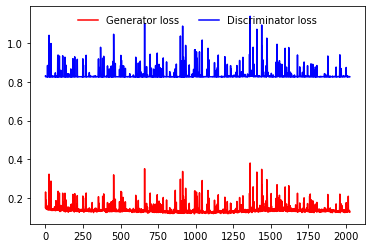

In [13]:
plt.plot(losses["gen_loss"],'-r',label='Generator loss')
plt.plot(losses["disc_loss"],'-b',label='Discriminator loss')
leg = plt.legend(loc='upper center',frameon=False,ncol=2)

## Results

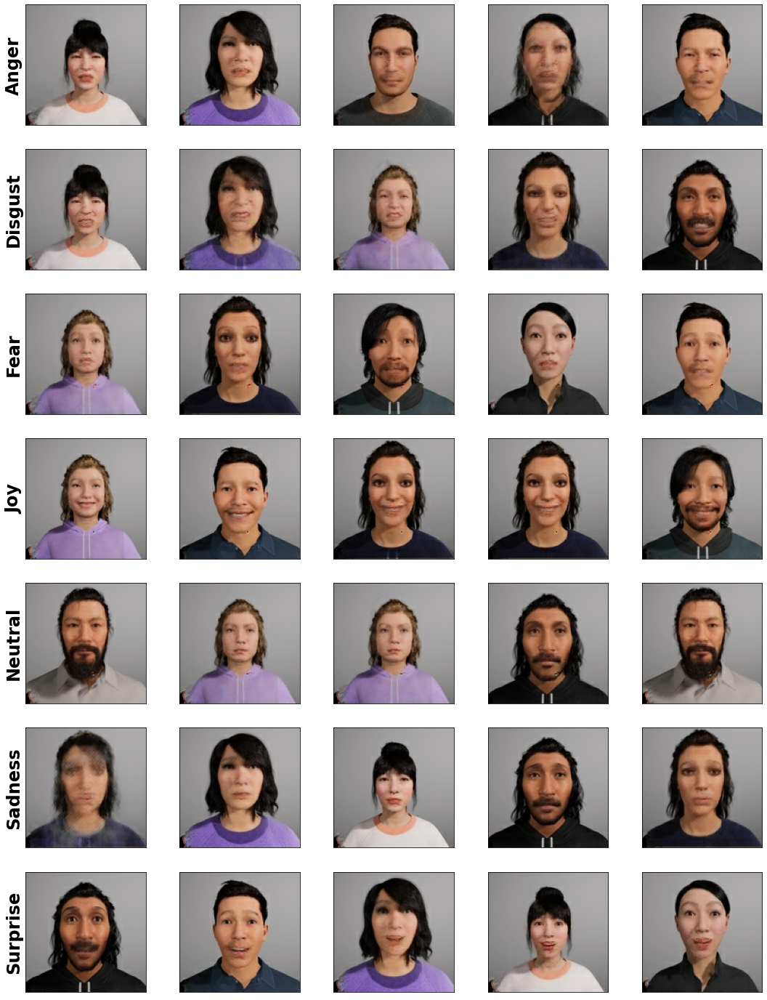

In [41]:
fig = plt.figure(figsize=(15, 25))

fig.subplots_adjust(left=0.01, right=0.99,  wspace=0.01)

for i in range(num_classes):
    latent_space = np.random.normal(0, 1, (5, latent_dim))
    lbl = np.zeros(shape=(5,num_classes))
    lbl[:,i] = np.random.normal(0,1)
    fake = decoder.predict([latent_space,lbl])
    for j in range(5):
        
        ax = fig.add_subplot(7,5, 5*i+j+1)
        img = (0.5*fake[j,:,:,:]+0.5)
        img = np.array(img)  
        ax.imshow(img)
        ax.set_yticks([])
        ax.set_xticks([])
        if(j==0):
            ax.set_ylabel(affects[i], fontsize=24,fontweight="bold")
#fig.tight_layout(pad=0, w_pad=0, h_pad=0)            
fig.savefig("results/random.png")

In [39]:
encoder.save("models/encoder_model.h5")
encoder.save_weights("models/encoder_weights.h5")
decoder.save("models/decoder_model.h5")
decoder.save_weights("models/decoder_weights.h5")
generator.save("models/generator_model.h5")
generator.save_weights("models/generator_weights.h5")
discriminator.save('models/discriminator_model.h5')
discriminator.save_weights('models/discriminator_weights.h5')

In [34]:
import glob
def load_test_images(img_dir):
    img_files = glob.glob(img_dir+"/*.jpg")
    latent_vecs = []
    conditions = []
    imgs = []
    for img_file in img_files:
        
        img = tf.io.read_file(img_file)
        img =  tf.image.decode_png(img,channels=3)
        imgs.append(img)
        img = tf.cast(img, tf.float32)
        img = normalize(img)
        img = tf.reshape(img,shape=(1,128,128,3))
        lbl  = tf.constant([0,0,0,0,1,0,0])              #Assuming that the test images are in neutral emotion (otherwise change this accordingly)
        lbl = tf.reshape(lbl,shape=(1,7))
        latent_vec,mu,sigma = encoder.predict([img,lbl])
        conditions.append(lbl)
        latent_vecs.append(mu)        
    return imgs,latent_vecs,conditions

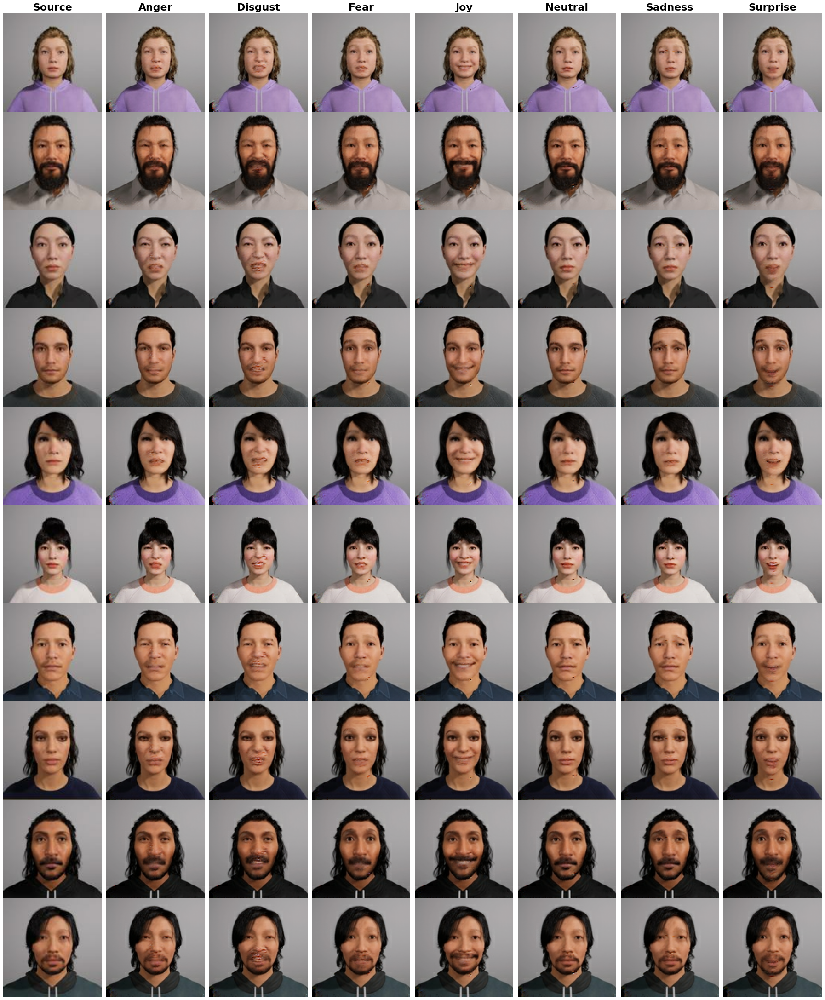

In [35]:

ref_imgs,latent_vecs,conditions = load_test_images("test")

fig, axes = plt.subplots(num_characters, num_classes+1,figsize=(25,30))


for k,ref_img,mu,condition in zip(range(0,num_characters),ref_imgs,latent_vecs,conditions):
    ax = axes[k][0]
    ax.imshow(ref_imgs[k])
    
    if(k==0):
        ax.set_title("Source", fontsize=22,fontweight="bold")
    ax.axis('off')
    for i in range(1,num_classes+1):
            lbl  = np.zeros(num_classes)
            lbl[i-1] = 1
            lbl = lbl.reshape((1,num_classes))
            fake = decoder.predict([mu,lbl])
            fake = tf.reshape(fake,shape=(128,128,3))
            fake = (0.5*fake+0.5)
            ax = axes[k][i]
            ax.imshow(fake)
            ax.axis('off')
            if(k==0):
                ax.set_title(affects[i-1], fontsize=22,fontweight="bold")
#line = plt.Line2D((.125,.125),(0.01,.98), color="w", linewidth=3)
#fig.add_artist(line)
fig.tight_layout(pad=0, w_pad=0, h_pad=0)
fig.savefig("results/transformations.png")

## Generating Mixed Expressions

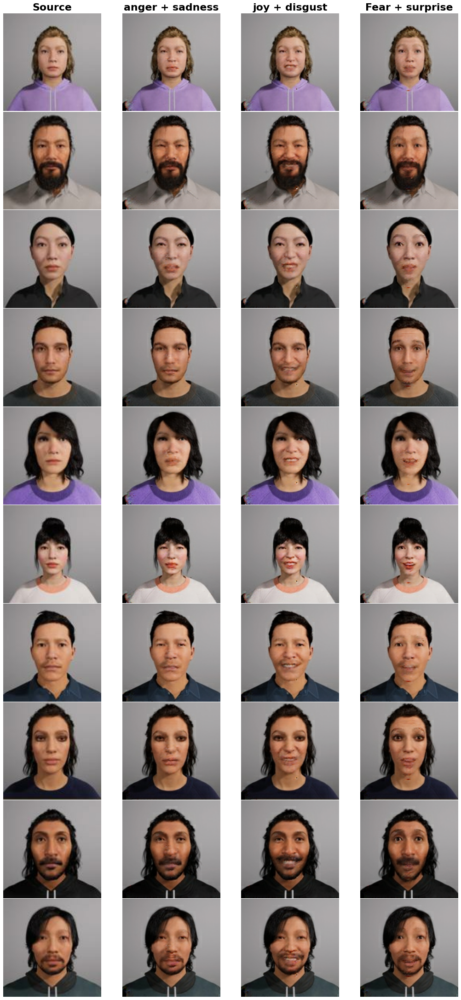

In [38]:
fig, axes = plt.subplots(num_characters, 4,figsize=(15,30))
mixed_affects = ["anger + sadness","joy + disgust","Fear + surprise"]

lbls  = np.zeros(shape=(3,num_classes))
lbls[0,:] = [0.9,0,0,0,0,-0.7,0]   #anger + sadness
lbls[1,:] = [0,-0.9,0,0.8,0,0,0]   #joy + disgust
lbls[2,:] = [0,0,-0.9,0,0,0,0.75]   #Fear + surprise


for k,ref_img,mu,condition in zip(range(0,num_characters),ref_imgs,latent_vecs,conditions):
    ax = axes[k][0]
    ax.imshow(ref_imgs[k])
    
    if(k==0):
        ax.set_title("Source", fontsize=22,fontweight="bold")
    ax.axis('off')
    for i in range(1,4):
            lbl = lbls[i-1,:]
            lbl = lbl.reshape((1,7))
            
            fake = decoder.predict([mu,lbl])
            fake = tf.reshape(fake,shape=(128,128,3))
            fake = (0.5*fake+0.5)
            ax = axes[k][i]
            ax.imshow(fake)
            ax.axis('off')
            if(k==0):
                ax.set_title(mixed_affects[i-1], fontsize=22,fontweight="bold")
fig.tight_layout(pad=0.1, w_pad=0.01)
fig.savefig("results/hybrid.png")

## Animation


In [36]:
from PIL import Image

affect_variation = np.linspace(-1,1,100)
imgs = []
src_idx = 4
lbl  = np.zeros(7)
#lbl[src_idx] = 1
    
for tar_idx in range(num_classes):
    
    for k in range(20):
        big_img = -0.8 * np.ones((128*2,128*5,3)) 
        lbl[tar_idx] += 0.08
        #lbl[src_idx] -= 0.1
        affect = lbl.reshape((1,7))
        for i,mu in zip(range(len(latent_vecs)),latent_vecs):
                
                pred = decoder.predict([mu,affect])
                img = tf.reshape(pred,shape=(128,128,3))
                img = (0.5*img+0.5)
                if(i<5):
                    big_img[0:128,i*128:i*128+128,:] = img
                if(i>=5):
                    big_img[128:256,(i-5)*128:(i-5)*128+128,:] = img
        imgs.append(Image.fromarray(np.uint8(big_img*255),mode='RGB'))
    #src_idx = tar_idx
    lbl[tar_idx] = 0

In [37]:
gif = []
for img in imgs:
    gif.append(img.convert("P",palette=Image.ADAPTIVE))
gif[0].save("results/FExGAN-Meta.gif", format='GIF', append_images=gif[1:],save_all=True, duration=150, loop=0)